# Zbozinek TD, Perez OD, Wise T, Fanselow M, & Mobbs D

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from theano import scan
import theano.tensor as T
import pymc3 as pm
import theano
import seaborn as sns
import os, sys, subprocess
import pickle

# Load Data

In [13]:
data = pd.read_csv(os.path.join('../data/', "2nd_POS_Modeling_Data_OS1.csv"))

In [14]:
data['DV'] = ((data['DV'].values - 1) / 2) - 1

observed_R = data.pivot(columns = 'ID', index = 'trialseq', values = 'DV').values[:, np.newaxis, :] #values.T transposes the data, so you can make trials the first dimension or participants first

# Occasion Setting Model

In [15]:
def learning_function(stimuli_shown, Λ, λ, training_or_test, prev_V, prev_Vbar, prev_P, prev_N, prev_Phat, prev_Nhat, stimulus_type, OS1_type, α,
                     iotaP, iotaN, iotaPabs):
    
    Λbar = T.zeros_like(Λ)
    Λbar = T.inc_subtensor(Λbar[0,:], (prev_V[4,:] > 0) * (1 - Λ[0, :]))    #Dcs
    Λbar = T.inc_subtensor(Λbar[1,:], (prev_V[2,:] > 0) * (1 - Λ[2, :]))    #D1
    Λbar = T.inc_subtensor(Λbar[2,:], (prev_V[2,:] > 0) * (1 - Λ[2, :]))    #Ecs
    Λbar = T.inc_subtensor(Λbar[3,:], (prev_V[4,:] > 0) * (1 - Λ[4, :]))    #E1
    Λbar = T.inc_subtensor(Λbar[4,:], (prev_V[4,:] > 0) * (1 - Λ[4, :]))    #F
    Λbar = T.inc_subtensor(Λbar[5,:], (prev_V[4,:] > 0) * (1 - Λ[5, :]))    #S
    Λbar = T.inc_subtensor(Λbar[6,:], (prev_V[6,:] > 0) * (1 - Λ[6, :]))    #G
    Λbar = T.inc_subtensor(Λbar[7,:], (prev_V[6,:] > 0) * (1 - Λ[6, :]))    #H
    Λbar = T.inc_subtensor(Λbar[8,:], (prev_V[8,:] > 0) * (1 - Λ[8, :]))    #Mcs
    Λbar = T.inc_subtensor(Λbar[9,:], (prev_V[10,:] > 0) * (1 - Λ[10, :]))  #M1
    Λbar = T.inc_subtensor(Λbar[10,:], (prev_V[10,:] > 0) * (1 - Λ[10, :])) #N
    Λbar = T.inc_subtensor(Λbar[11,:], (prev_V[10,:] > 0) * (1 - Λ[11, :])) #Ucs
    Λbar = T.inc_subtensor(Λbar[12,:], (prev_V[8,:] > 0) * (1 - Λ[8, :]))   #U1
    Λbar = T.inc_subtensor(Λbar[13,:], (prev_V[2,:] > 0) * (1 - Λ[2, :]))   #D1_abs
    Λbar = T.inc_subtensor(Λbar[14,:], (prev_V[4,:] > 0) * (1 - Λ[4, :]))   #E1_abs
    Λbar = T.inc_subtensor(Λbar[15,:], (prev_V[10,:] > 0) * (1 - Λ[10, :])) #M1_abs
    Λbar = T.inc_subtensor(Λbar[16,:], (prev_V[8,:] > 0) * (1 - Λ[10, :]))  #U1_abs
    
    #λbar
    λbar = T.zeros_like(Λbar)
    λbar = T.inc_subtensor(λbar[0,:], prev_V[4,:])    #Dcs
    λbar = T.inc_subtensor(λbar[1,:], prev_V[2,:])    #D1
    λbar = T.inc_subtensor(λbar[2,:], prev_V[2,:])    #Ecs
    λbar = T.inc_subtensor(λbar[3,:], prev_V[4,:])    #E1
    λbar = T.inc_subtensor(λbar[4,:], prev_V[4,:])    #F
    λbar = T.inc_subtensor(λbar[5,:], prev_V[4,:])    #S
    λbar = T.inc_subtensor(λbar[6,:], prev_V[6,:])    #G
    λbar = T.inc_subtensor(λbar[7,:], prev_V[6,:])    #H
    λbar = T.inc_subtensor(λbar[8,:], prev_V[8,:])    #Mcs
    λbar = T.inc_subtensor(λbar[9,:], prev_V[10,:])   #M1
    λbar = T.inc_subtensor(λbar[10,:], prev_V[10,:])  #N
    λbar = T.inc_subtensor(λbar[11,:], prev_V[10,:])  #Ucs
    λbar = T.inc_subtensor(λbar[12,:], prev_V[8,:])   #U1
    λbar = T.inc_subtensor(λbar[13,:], prev_V[2,:])   #D1_abs
    λbar = T.inc_subtensor(λbar[14,:], prev_V[4,:])   #E1_abs
    λbar = T.inc_subtensor(λbar[15,:], prev_V[10,:])  #M1_abs
    λbar = T.inc_subtensor(λbar[16,:], prev_V[8,:])   #U1_abs


    pe_V = λ - prev_V
    pe_Vbar = λbar - prev_Vbar
    pe_P = λ - prev_P
    pe_N = λbar - prev_N
    
    pe_Phat = λ - prev_Phat
    pe_Nhat = λbar - prev_Nhat
    
    #Iotas
    iotaP     = iotaP       *(stimuli_shown[[1,12        ],:].sum(axis=0) > 0)
    iotaPabs  = iotaPabs    *(stimuli_shown[[13,14,15,16],:].sum(axis=0) > 0)
    iotaN     = iotaN       *(stimuli_shown[[1,3,9,12   ],:].sum(axis=0) > 0)
  
    #γ
    prev_γ1 = prev_V * prev_Vbar


    CS_prev_γ1 = (prev_γ1 * stimuli_shown).sum(axis=0)
    ΔV = Λ * (α) * pe_V
    ΔVbar = Λbar * (α) * pe_Vbar
    ΔP = Λ * (α) * CS_prev_γ1 * pe_P
    ΔN = Λbar * (α) * CS_prev_γ1 * pe_N
    
    ΔPhat = Λ *    (α) * CS_prev_γ1 * pe_Phat
    ΔNhat = Λbar * (α) * CS_prev_γ1 * pe_Nhat

    # Only update stimuli that were shown
    ΔV = ΔV * stimuli_shown
    ΔVbar = ΔVbar * stimuli_shown
    ΔP = ΔP * stimuli_shown
    ΔN = ΔN * stimuli_shown
    
    ΔPhat = ΔPhat * stimuli_shown
    ΔNhat = ΔNhat * stimuli_shown
    
    # Update V, Vbar, P, N, "hats"
    V = T.zeros_like(prev_V)
    Vbar = T.zeros_like(prev_Vbar)
    P = T.zeros_like(prev_P)
    N = T.zeros_like(prev_N)
    
    Phat = T.zeros_like(prev_Phat)
    Nhat = T.zeros_like(prev_Nhat)

    
    # Only update V and Vbar for CSs. Only update P and N for 1st-order OSs.
    V = T.inc_subtensor(V[T.eq(stimulus_type, 1)], prev_V[T.eq(stimulus_type, 1)] + ΔV[T.eq(stimulus_type, 1)] * training_or_test)
    Vbar = T.inc_subtensor(Vbar[T.eq(stimulus_type, 1)], prev_Vbar[T.eq(stimulus_type, 1)] + ΔVbar[T.eq(stimulus_type, 1)] * training_or_test)
    P = T.inc_subtensor(P[T.eq(OS1_type, 1)], prev_P[T.eq(OS1_type, 1)] + ΔP[T.eq(OS1_type, 1)] * (iotaP + iotaPabs) * training_or_test)
    N = T.inc_subtensor(N[T.eq(OS1_type, 1)], prev_N[T.eq(OS1_type, 1)] + ΔN[T.eq(OS1_type, 1)] * (iotaN) * training_or_test)
    
    Phat = T.inc_subtensor(Phat[T.eq(stimulus_type, 1)], prev_Phat[T.eq(stimulus_type, 1)] + ΔPhat[T.eq(stimulus_type, 1)] * training_or_test)
    Nhat = T.inc_subtensor(Nhat[T.eq(stimulus_type, 1)], prev_Nhat[T.eq(stimulus_type, 1)] + ΔNhat[T.eq(stimulus_type, 1)] * training_or_test)
    
    return V, Vbar, P, N, Phat, Nhat

# Generate Simulated Data with Model

In [16]:
n_stim = 17
n_subjects = len(data['ID'].unique())

#Initial values
R = np.zeros((n_stim, n_subjects))
overall_R = np.zeros((1, n_subjects))
v_excitatory = np.zeros((n_stim, n_subjects))
v_inhibitory = np.zeros((n_stim, n_subjects))
P = np.zeros((n_stim, n_subjects))
N = np.zeros((n_stim, n_subjects))

Phat = np.zeros((n_stim, n_subjects))
Nhat = np.zeros((n_stim, n_subjects))


#Randomized parameter values - use this if you want to compare simulated vs recovered parameters and comment out the "α = 1" code in the subsequent lines
gen_dist = pm.Beta.dist(2, 2, shape = n_subjects)
α_subject_sim = gen_dist.random()

iotaP_subject_sim     = gen_dist.random()
iotaPabs_subject_sim  = gen_dist.random()
iotaN_subject_sim     = gen_dist.random()


# #parameters = 1 - use this if you want to create the Individual vs Real figures at the bottom of this notebook
# gen_dist = pm.Beta.dist(2, 2, shape=n_subjects)
# α_subject_sim = np.ones(n_subjects)

# iotaP_subject_sim     = np.ones(n_subjects)
# iotaPabs_subject_sim  = np.ones(n_subjects)
# iotaN_subject_sim     = np.ones(n_subjects)


#Test vs Training Trial
training_or_test = data.pivot(index='trialseq', values='Test', columns='ID').values[:, np.newaxis, :].astype(float)

#US values
small_lambda = data.pivot(index='trialseq', values='US', columns='ID').values[:, np.newaxis, :].repeat(n_stim, axis=1).astype(float)
stim_data = []

for sub in data['ID'].unique():
    stim_data.append(data.loc[data['ID'] == sub, ['Dcs', 'D1', 'Ecs', 'E1', 'F', 'S', 'G', 'H', 'Mcs', 
                                                  'M1', 'N', 'Ucs', 'U1', 'D1_abs', 'E1_abs', 
                                                  'M1_abs', 'U1_abs']].values)

stimuli_shown = np.dstack(stim_data)
big_lambda = small_lambda

#Add imaginary -1th trial
big_lambda = np.vstack([np.zeros((1, n_stim, n_subjects)), big_lambda[:-1, ...]]).astype(float) # Add one trial of zeros to the start, remove the last trial
small_lambda = big_lambda
stimuli_shown = np.vstack([np.zeros((1, n_stim, n_subjects)), stimuli_shown]) # Add one trial of zeros to the start, DO NOT remove the last trial - this is needed for prediction

stimulus_type = np.ones(n_stim)
stimulus_type[[1, 3, 9, 12, 13, 14, 15, 16]] = 0 #make all OSs = 0

OS1_type = np.zeros(n_stim)
OS1_type[[1, 3, 9, 12, 13, 14, 15, 16]] = 1 #make 1st OSs = 1

#Convert task outcomes to tensors
big_lambda = T.as_tensor_variable(big_lambda.astype(float))
small_lambda = T.as_tensor_variable(small_lambda.astype(float))
stimuli_shown = T.as_tensor_variable(stimuli_shown)
training_or_test = T.as_tensor_variable(training_or_test)

stimuli_shown_sim = stimuli_shown.copy()
big_lambda_sim = big_lambda.copy()
small_lambda_sim = small_lambda.copy()
training_or_test_sim = training_or_test.copy()

# Run Simulation

In [17]:
#Run the loop
output, updates = scan(fn=learning_function,
                    sequences=[{'input': stimuli_shown_sim[:-1, ...]},
                             {'input': big_lambda_sim},
                             {'input': small_lambda_sim},
                              {'input': training_or_test}],
                    outputs_info=[v_excitatory, v_inhibitory, P, N, Phat, Nhat],
                    non_sequences = [stimulus_type, OS1_type, α_subject_sim, 
                                    iotaP_subject_sim,    
                                    iotaPabs_subject_sim, 
                                    iotaN_subject_sim,    
                                    ])

#Get model output
V_out, Vbar_out, P_out, N_out, Phat_out, Nhat_out = [i.eval() for i in output]

estimated_overall_R = ((V_out * stimuli_shown_sim[1:, ...]).sum(axis=1) - (Vbar_out * stimuli_shown_sim[1:, ...]).sum(axis=1)) + \
    ((P_out * stimuli_shown_sim[1:, ...]).sum(axis=1) * (Phat_out * stimuli_shown_sim[1:, ...]).sum(axis=1) * (Vbar_out * stimuli_shown_sim[1:, ...]).sum(axis=1)) - \
    ((N_out * stimuli_shown_sim[1:, ...]).sum(axis=1) * (Nhat_out * stimuli_shown_sim[1:, ...]).sum(axis=1) * (V_out * stimuli_shown_sim[1:, ...]).sum(axis=1))

overall_R_sim = estimated_overall_R.eval()

# Check parameter recovery

In [18]:
n_subjects = len(data['ID'].unique())

#Initial values
R = np.zeros((n_stim, n_subjects))

#US values
small_lambda = data.pivot(index='trialseq', values='US', columns='ID').values[:, np.newaxis, :].repeat(n_stim, axis=1).astype(float)
# small_lambda = data.pivot(columns = 'ID', index = 'trialseq', values = 'US').values [:, :, np.newaxis].repeat(8, axis=0).astype(float)
stim_data = []

for sub in data['ID'].unique():
    stim_data.append(data.loc[data['ID'] == sub, ['Dcs', 'D1', 'Ecs', 'E1', 'F', 'S', 'G', 'H', 'Mcs', 
                                                  'M1', 'N', 'Ucs', 'U1', 'D1_abs', 'E1_abs', 
                                                  'M1_abs', 'U1_abs']].values)

stimuli_shown = np.dstack(stim_data)
big_lambda = small_lambda

#Add imaginary -1th trial
big_lambda = np.vstack([np.zeros((1, n_stim, n_subjects)), big_lambda[:-1, ...]]).astype(float) # Add one trial of zeros to the start, remove the last trial
small_lambda = big_lambda
stimuli_shown = np.vstack([np.zeros((1, n_stim, n_subjects)), stimuli_shown]) # Add one trial of zeros to the start, DO NOT remove the last trial - this is needed for prediction

stimulus_type = np.ones(n_stim)
stimulus_type[[1, 3, 9, 12, 13, 14, 15, 16]] = 0 #make all OSs = 0

OS1_type = np.zeros(n_stim)
OS1_type[[1, 3, 9, 12, 13, 14, 15, 16]] = 1 #make 1st OSs = 1


#Convert task outcomes to tensors
big_lambda = T.as_tensor_variable(big_lambda.astype(float))
small_lambda = T.as_tensor_variable(small_lambda.astype(float))
stimuli_shown = T.as_tensor_variable(stimuli_shown)

with pm.Model() as model:
    
    # Learning rate lies between 0 and 1 so we use a beta distribution
    α_mean = pm.Normal('α_mean', 0.5, 10)
    α_sd = pm.HalfCauchy('α_sd', 10)

    iotaP_mean    = pm.Normal    ('iotaP_mean', 0.5, 10)
    iotaP_sd      = pm.HalfCauchy('iotaP_sd', 10)
    iotaPabs_mean = pm.Normal    ('iotaPabs_mean', 0.5, 10)
    iotaPabs_sd   = pm.HalfCauchy('iotaPabs_sd', 10)    
    iotaN_mean    = pm.Normal    ('iotaN_mean', 0.5, 10)
    iotaN_sd      = pm.HalfCauchy('iotaN_sd', 10)
    
   
    BoundedNormal = pm.Bound(pm.Normal, lower=0, upper=1)
    α_subject = BoundedNormal('α', mu=α_mean, sd=α_sd, shape=(n_subjects,))
    
    iotaP_subject        = BoundedNormal('iotaP'    ,    mu=iotaP_mean,    sd=iotaP_sd,    shape=(n_subjects,))
    iotaPabs_subject     = BoundedNormal('iotaPabs' ,    mu=iotaPabs_mean, sd=iotaPabs_sd, shape=(n_subjects,))
    iotaN_subject        = BoundedNormal('iotaN'    ,    mu=iotaN_mean,    sd=iotaN_sd,    shape=(n_subjects,))
    

    
    # Run the loop
    output, updates = scan(fn=learning_function,
                      sequences=[{'input': stimuli_shown[:-1, ...]},
                                {'input': big_lambda},
                                {'input': small_lambda},
                                {'input': training_or_test}],
                      outputs_info=[v_excitatory, v_inhibitory, P, N, Phat, Nhat],
                      non_sequences=[stimulus_type, OS1_type, α_subject, 
                                     iotaP_subject, 
                                     iotaPabs_subject, 
                                     iotaN_subject, 
                                    ])
    
    # Get model output
    V, Vbar, P, N, Phat, Nhat = output
    
    # # Single R value
    estimated_overall_R = ((V * stimuli_shown[1:, ...]).sum(axis=1) - (Vbar * stimuli_shown[1:, ...]).sum(axis=1)) + \
        ((P * stimuli_shown[1:, ...]).sum(axis=1) * (Phat * stimuli_shown[1:, ...]).sum(axis=1) * (Vbar * stimuli_shown[1:, ...]).sum(axis=1)) - \
        ((N * stimuli_shown[1:, ...]).sum(axis=1) * (Nhat * stimuli_shown[1:, ...]).sum(axis=1) * (V * stimuli_shown[1:, ...]).sum(axis=1))
 
    # This allows us to output the estimated R
    estimated_overall_R = pm.Deterministic('estimated_overall_R', estimated_overall_R)
    
    # Reshape output of the model and get categorical likelihood
    sigma = pm.HalfCauchy('sigma', 0.5)
    likelihood = pm.Normal('likelihood', mu=estimated_overall_R, sigma=sigma, observed=pd.DataFrame(overall_R_sim.squeeze()))


# Fit the Model

#### Variational Inference

In [66]:
from pymc3.variational.callbacks import CheckParametersConvergence
with model:
    approx = pm.fit(method='advi', n=25000, callbacks=[CheckParametersConvergence()])

Average Loss = -81,823: 100%|██████████| 25000/25000 [3:57:58<00:00,  1.75it/s]  
Finished [100%]: Average Loss = -81,861


In [67]:
trace = approx.sample(1000)

In [71]:
#Saves model results; optional
with open('Exp2_OS1_Simulated.pkl', 'wb') as f:
    pickle.dump(trace, f)

In [ ]:
#Loads model results; optional
trace = pickle.load(open('Exp2_OS1_Simulated.pkl', 'rb'))

In [69]:
recovered_data = {
    'Simulated_α': α_subject_sim, 'Recovered_α': trace['α'].mean(axis=0),
    'Simulated_ί_P': iotaP_subject_sim, 'Recovered_ί_P': trace['iotaP'].mean(axis=0),
    'Simulated_ί_Pabs': iotaPabs_subject_sim, 'Recovered_ί_Pabs': trace['iotaPabs'].mean(axis=0),
    'Simulated_ί_N': iotaN_subject_sim, 'Recovered_ί_N': trace['iotaN'].mean(axis=0),
#     'Simulated_ί_Nabs': iotaNabs_subject_sim, 'Recovered_ί_Nabs': trace['iotaNabs'].mean(axis=0),
}

recovered_data = pd.DataFrame(recovered_data)
recovered_data.to_csv(os.path.join('../output/',r'Exp2_OS1_Simulated_vs_Recovered_Parameters.csv'))

C:\Users\tzboz\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\tzboz\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\tzboz\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\tzboz\anacond

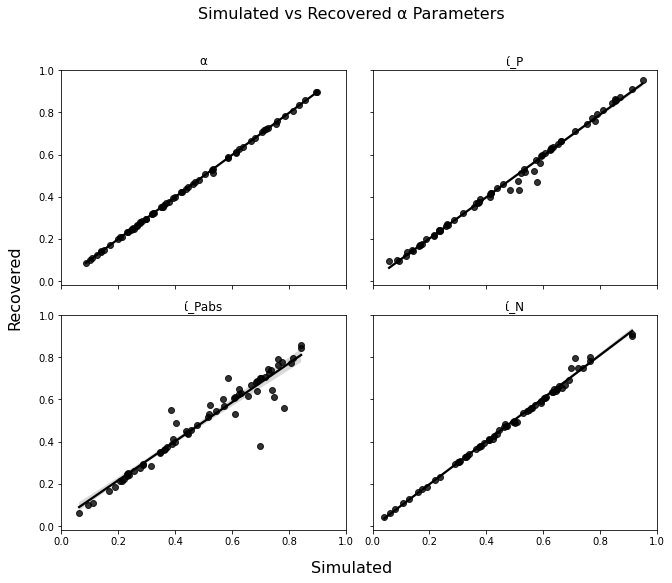

In [70]:
f, ax = plt.subplots(2, 2, sharex = True, sharey = True, figsize=(9, 7.5))
f.suptitle('Simulated vs Recovered α Parameters', y=1.02, fontsize = 16)
f.text(.5, -.02, 'Simulated', va='center', ha='center', fontsize = 16)
f.text(-.02, .5, 'Recovered', va='center', ha='center', fontsize = 16, rotation=90)

sns.regplot(α_subject_sim          , trace['α'         ].mean(axis=0), label='α_subject'        , ax=ax[0,0], color = 'black')
sns.regplot(iotaP_subject_sim      , trace['iotaP'     ].mean(axis=0), label='iotaP_subject'    , ax=ax[0,1], color = 'black')
sns.regplot(iotaPabs_subject_sim   , trace['iotaPabs'  ].mean(axis=0), label='iotaPabs_subject' , ax=ax[1,0], color = 'black')
sns.regplot(iotaN_subject_sim      , trace['iotaN'     ].mean(axis=0), label='iotaN_subject'    , ax=ax[1,1], color = 'black')

for i in range(2):
    for j in range(2):
        ax[0,0].set_title('α')
        ax[0,1].set_title('ί_P')
        ax[1,0].set_title('ί_Pabs')
        ax[1,1].set_title('ί_N')


plt.setp(ax, xticks=[0, .2, .4, .6, .8, 1], yticks=[0, .2, .4, .6, .8, 1])        
plt.tight_layout()

plt.savefig(os.path.join('../output/',r'Exp2_OS1_Simulated_vs_Recovered.svg'), bbox_inches='tight')

# Fit the Model to Real Data

In [19]:
n_subjects = len(data['ID'].unique())

# Initial values
R = np.zeros((n_stim, n_subjects))  # Value estimate
overall_R = np.zeros((1, n_subjects))
v_excitatory = np.zeros((n_stim, n_subjects)) 
v_inhibitory = np.zeros((n_stim, n_subjects)) 
P = np.zeros((n_stim, n_subjects))
N = np.zeros((n_stim, n_subjects))

Phat = np.zeros((n_stim, n_subjects))
Nhat = np.zeros((n_stim, n_subjects))

# US values
small_lambda = data.pivot(index='trialseq', values='US', columns='ID').values[:, np.newaxis, :].repeat(n_stim, axis=1)
stim_data = []

for sub in data['ID'].unique():
    stim_data.append(data.loc[data['ID'] == sub, ['Dcs', 'D1', 'Ecs', 'E1', 'F', 'S', 'G', 'H', 'Mcs', 
                                                  'M1', 'N', 'Ucs', 'U1', 'D1_abs', 'E1_abs', 
                                                  'M1_abs', 'U1_abs']].values)
    
stimuli_shown = np.dstack(stim_data)
big_lambda = small_lambda

# Add imaginary -1th trial
big_lambda = np.vstack([np.zeros((1, n_stim, n_subjects)), big_lambda[:-1, ...]])  # Add one trial of zeros to the start, remove the last trial
small_lambda = big_lambda
stimuli_shown = np.vstack([np.zeros((1, n_stim, n_subjects)), stimuli_shown]) # Add one trial of zeros to the start, DO NOT remove the last trial - this is needed for prediction

stimulus_type = np.ones(n_stim)
stimulus_type[[1, 3, 9, 12, 13, 14, 15, 16]] = 0 #make all OSs = 0

OS1_type = np.zeros(n_stim)
OS1_type[[1, 3, 9, 12, 13, 14, 15, 16]] = 1 #make 1st OSs = 1

# Convert task outcomes to tensors
big_lambda = T.as_tensor_variable(big_lambda)
small_lambda = T.as_tensor_variable(small_lambda)
stimuli_shown = T.as_tensor_variable(stimuli_shown)

with pm.Model() as model:
    
    # Learning rate lies between 0 and 1 so we use a beta distribution
    α_mean = pm.Normal('α_mean', 0.5, 10)
    α_sd = pm.HalfCauchy('α_sd', 10)

    iotaP_mean    = pm.Normal    ('iotaP_mean', 0.5, 10)
    iotaP_sd      = pm.HalfCauchy('iotaP_sd', 10)
    iotaPabs_mean = pm.Normal    ('iotaPabs_mean', 0.5, 10)
    iotaPabs_sd   = pm.HalfCauchy('iotaPabs_sd', 10)    
    iotaN_mean    = pm.Normal    ('iotaN_mean', 0.5, 10)
    iotaN_sd      = pm.HalfCauchy('iotaN_sd', 10)
    
   
    BoundedNormal = pm.Bound(pm.Normal, lower=0, upper=1)
    α_subject = BoundedNormal('α', mu=α_mean, sd=α_sd, shape=(n_subjects,))
    
    iotaP_subject        = BoundedNormal('iotaP'    ,    mu=iotaP_mean,    sd=iotaP_sd,    shape=(n_subjects,))
    iotaPabs_subject     = BoundedNormal('iotaPabs' ,    mu=iotaPabs_mean, sd=iotaPabs_sd, shape=(n_subjects,))
    iotaN_subject        = BoundedNormal('iotaN'    ,    mu=iotaN_mean,    sd=iotaN_sd,    shape=(n_subjects,))
    

    
    # Run the loop
    output, updates = scan(fn=learning_function,
                      sequences=[{'input': stimuli_shown[:-1, ...]},
                                {'input': big_lambda},
                                {'input': small_lambda},
                                {'input': training_or_test}],
                      outputs_info=[v_excitatory, v_inhibitory, P, N, Phat, Nhat],
                      non_sequences=[stimulus_type, OS1_type, α_subject, 
                                     iotaP_subject, 
                                     iotaPabs_subject, 
                                     iotaN_subject, 
                                    ])
    
    # Get model output
    V, Vbar, P, N, Phat, Nhat = output
    
    # # Single R value
    estimated_overall_R = ((V * stimuli_shown[1:, ...]).sum(axis=1) - (Vbar * stimuli_shown[1:, ...]).sum(axis=1)) + \
        ((P * stimuli_shown[1:, ...]).sum(axis=1) * (Phat * stimuli_shown[1:, ...]).sum(axis=1) * (Vbar * stimuli_shown[1:, ...]).sum(axis=1)) - \
        ((N * stimuli_shown[1:, ...]).sum(axis=1) * (Nhat * stimuli_shown[1:, ...]).sum(axis=1) * (V * stimuli_shown[1:, ...]).sum(axis=1))
     
    # This allows us to output the estimated R
    estimated_overall_R = pm.Deterministic('estimated_overall_R', estimated_overall_R)
          
    # Reshape output of the model and get categorical likelihood
    sigma = pm.HalfCauchy('sigma', 0.5)
    likelihood = pm.Normal('likelihood', mu=estimated_overall_R, sigma=sigma, observed=pd.DataFrame(observed_R.squeeze()))

#### Variational Inference

In [9]:
from pymc3.variational.callbacks import CheckParametersConvergence
with model:
    approx = pm.fit(method='advi', n=25000, callbacks=[CheckParametersConvergence()])

Average Loss = 21,814: 100%|██████████| 25000/25000 [3:26:29<00:00,  2.02it/s]  
Finished [100%]: Average Loss = 21,813


In [10]:
trace = approx.sample(1000)

In [11]:
#Saves model results; optional
with open('Exp2_OS1.pkl', 'wb') as f:
    pickle.dump(trace, f)

In [ ]:
#Loads model results; optional
trace = pickle.load(open('Exp2_OS1.pkl', 'rb'))

In [76]:
parameter_output = pm.summary(trace, kind='stats', varnames=[i for i in model.named_vars if 'α' in i and not i in model.deterministics and not 'log' in i and not 'interval' in i
                                                         or 'iota' in i and not i in model.deterministics and not 'log' in i and not 'interval' in i])

C:\Users\tzboz\anaconda3\lib\site-packages\pymc3\stats\__init__.py:19: UserWarning: Keyword argument `varnames` renamed to `var_names`, and will be removed in pymc3 3.9
  warnings.warn(


# Model Output

In [77]:
overall_R_mean = trace['estimated_overall_R'].mean(axis=0)
overall_R_sd = trace['estimated_overall_R'].std(axis=0)
sub_ids = data['ID'].unique()
subs = [np.where(data['ID'].unique() == sub)[0][0] for sub in sub_ids]

In [78]:
waic_output = pm.waic(trace)

C:\Users\tzboz\anaconda3\lib\site-packages\arviz\stats\stats.py:1194: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


In [79]:
waic_output

Computed from 1000 by 22981 log-likelihood matrix

        Estimate       SE
IC_waic 43288.54   249.45
p_waic    356.70        -

There has been a warning during the calculation. Please check the results.

In [80]:
parameter_output.to_csv(os.path.join('../output/',r'Exp2_OS1_Parameters.csv'))
waic_output.to_csv(os.path.join('../output/',r'Exp2_OS1_WAIC.csv'))

In [94]:
from sklearn.metrics import r2_score
r2s = []

for n, sub in enumerate(data['ID'].unique()):
    r2s.append(r2_score(observed_R.squeeze()[:, n], overall_R_mean[:, n]))

group_r2 = np.median(r2s)

print(group_r2)

0.48329674975088976


In [95]:
r2s = {'R2': [r2s]}

r2s = pd.DataFrame(r2s)

r2s.to_csv(os.path.join('../output/',r'Exp2_OS1_R2.csv'))

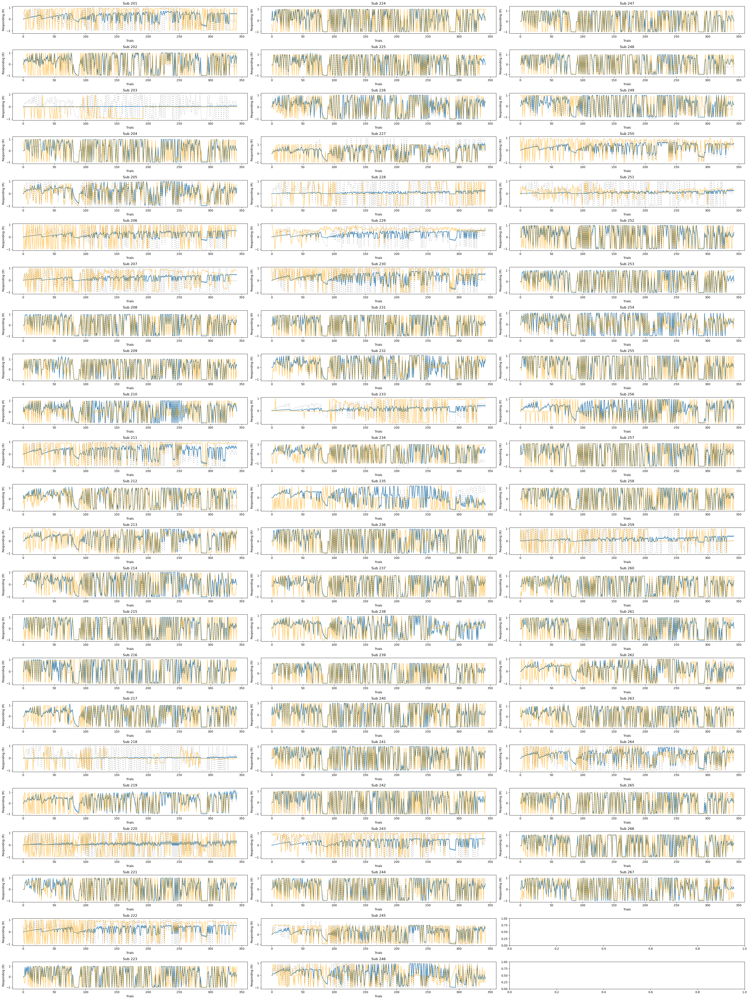

In [96]:
f, ax = plt.subplots(23, 3, figsize=(36, 48), dpi = 100)

overall_R_mean = trace['estimated_overall_R'].mean(axis=0)
overall_R_sd = trace['estimated_overall_R'].std(axis=0)

sub_ids = data['ID'].unique()

subs = [np.where(data['ID'].unique() == sub)[0][0] for sub in sub_ids]
    

for n, sub in enumerate(subs):
    ax[n % 23, int(n / 23)].fill_between(range(overall_R_mean.shape[0]), overall_R_mean[:, sub] - overall_R_sd[:, sub], overall_R_mean[:, sub] + overall_R_sd[:, sub], alpha=0.3)
    ax[n % 23, int(n / 23)].plot(overall_R_mean[:, sub], alpha = .9)
    ax[n % 23, int(n / 23)].plot(observed_R.squeeze()[:, sub], color='orange', linestyle='-', alpha = .6)#participant's real data
    ax[n % 23, int(n / 23)].plot(overall_R_sim.squeeze()[:, sub], color='black', linestyle=(0, (1, 3)), alpha = .35, linewidth = 1.75)#Alpha = 1; this is the correct answer if a person learned perfectly
    if n == 0:
        ax[n % 23, int(n / 23)].set_ylabel('Mean (+/-SD) overall R')
    ax[n % 23, int(n / 23)].set_ylabel('Responding (R)')
    ax[n % 23, int(n / 23)].set_xlabel('Trials')
    ax[n % 23, int(n / 23)].set_title('Sub {0}'.format(sub_ids[n]))   

plt.tight_layout()
plt.savefig(os.path.join('../output/',r'Exp2_OS1_Individual_Real_and_Estimated_Responding.svg'), bbox_inches='tight')

In [21]:
%load_ext watermark
%watermark -v -p pytest,jupyterlab,numpy,pandas,theano,pymc3

CPython 3.8.5
IPython 7.19.0

pytest 0.0.0
jupyterlab 2.2.6
numpy 1.19.2
pandas 1.1.5
theano 1.0.5
pymc3 3.8
